# CRYPTOCURRENCY DATA ANALYSIS -  Part 2


This second part of the project contains the Data Wrangling and Analysis Process of our scrapped crytocurrency data.

In this part of the project, we will be analyzing the scrapped live cryptocurrency market data from [Cryptowatch](https://cryptowat.ch/), a popular charting & trading terminal for cryptocurrency markets. It is important to note that this market trends data is solely about the the Crypto market transactions and tradings done on Binance Exchange platform, one of the trading platforms on Cryptowatch.

The goal of this project is to analyze the market trends and movements of the top 10 crytocurrencies for the past four years, starting from 1st September, 2018 (2018-09-01) to 5th September, 2022 (2022-09-05), and to generate insights from the visualizations.

# Data Dictionary

The scrapped dataset comprises of 7 columns which include:

    
  1. CloseTime: This refers to the particular date and time of a particular market movement of a coin. From this column, we extracted the date, year and month columns.
  

  2. ClosePrice: The Closing price of a coin at within a 24-hr time frame.
  
  
  3. OpenPrice: The Opening price of a coin within a 24-hr time frame.
  
  
  4. HighPrice: The highest price of a coin within same 24 hour time limit.
  
  
  5. LowPrice: The lowest price of a coin within same 24 hour time limit.
  
  
  6. volume: the number of coins traded within a day; 24 hours.
  
  
 7. MarketCap: the crypto market cap is the market value of a cryptocurrency. It's derived by multiplying the total number of mined cryptos and the prevailing market price. Since the number of mined cryptos and market price keeps changing, the crypto market cap also keeps fluctuating. Market Cap = supply x price.

# Importation of Libraries

In [1]:
# load EDA Packages
import pandas as pd
import numpy as np

# load data vizualization packages
import seaborn as sb
import matplotlib.pyplot as plt
%matplotlib inline

# other libraries for visualization
import matplotlib.dates as mdates
import matplotlib.ticker as mtick
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import iplot
import plotly.io as pio


# load web scrapping packages
import requests
from bs4 import BeautifulSoup as soup
from urllib.request import urlopen
import os

# Assessing the Data

In [2]:
# read the various crypto currencies from their csv files
coin_btc = pd.read_csv('btc.csv')
coin_eth = pd.read_csv('eth.csv')
coin_ada = pd.read_csv('ada.csv')
coin_xrp = pd.read_csv('xrp.csv')
coin_usdt = pd.read_csv('usdt.csv')
coin_matic = pd.read_csv('matic.csv')
coin_usdc = pd.read_csv('usdc.csv')
coin_shib = pd.read_csv('shib.csv')
coin_ftm = pd.read_csv('ftm.csv')
coin_uma = pd.read_csv('uma.csv')

In [3]:
# loading the btc coin data again into a pandas dataframe
coin_btc

,CloseTime,OpenPrice,HighPrice,LowPrice,ClosePrice,volume,MarketCap
0,2018-09-01 00:00:00,7042.95,7101.03,6998.87,7017.35,1353.671600,9.549478e+06
1,2018-09-01 06:00:00,7015.78,7070.00,7015.22,7042.34,338.595700,2.384278e+06
2,2018-09-01 12:00:00,7035.04,7131.85,7024.51,7058.97,874.048000,6.180810e+06
3,2018-09-01 18:00:00,7058.97,7230.00,7021.29,7196.27,1570.716700,1.124772e+07
4,2018-09-02 00:00:00,7193.30,7300.18,7169.99,7185.01,1807.095200,1.305408e+07
...,...,...,...,...,...,...,...
5858,2022-09-04 12:00:00,19771.00,19848.00,19586.00,19848.00,147.677626,2.910609e+06
5859,2022-09-04 18:00:00,19850.00,19950.00,19660.00,19843.00,157.141203,3.114347e+06
5860,2022-09-05 00:00:00,19834.00,20025.00,19809.00,20007.00,111.779251,2.225859e+06
5861,2022-09-05 06:00:00,20014.00,20051.00,19678.00,19722.00,166.173350,3.295136e+06


In [4]:
# assign Symbol column to the individual datasets
# This column gives the symbol to the coins
coin_btc['Symbol'] = 'BTC'
coin_eth['Symbol'] = 'ETH'
coin_ada['Symbol'] = 'ADA'
coin_xrp['Symbol'] = 'XRP'
coin_usdt['Symbol'] = 'USDT'
coin_matic['Symbol'] = 'MATIC'
coin_usdc['Symbol'] = 'USDC'
coin_shib['Symbol'] = 'SHIB'
coin_ftm['Symbol'] = 'FTM'
coin_uma['Symbol'] = 'UMA'

In [5]:
# assign Name column to the individual datasets
# This Column gives the names of the coins
coin_btc['Name'] = 'Bitcoin'
coin_eth['Name'] = 'Ethereum'
coin_ada['Name'] = 'Cardano'
coin_xrp['Name'] = 'Ripple'
coin_usdt['Name'] = 'Tether'
coin_matic['Name'] = 'Polygon'
coin_usdc['Name'] = 'USD Coin'
coin_shib['Name'] = 'SHIBA INU'
coin_ftm['Name'] = 'Fantom'
coin_uma['Name'] = 'Universal Market Access'

In [6]:
# use the btc dataframe to confirm the new columns
coin_btc

,CloseTime,OpenPrice,HighPrice,LowPrice,ClosePrice,volume,MarketCap,Symbol,Name
0,2018-09-01 00:00:00,7042.95,7101.03,6998.87,7017.35,1353.671600,9.549478e+06,BTC,Bitcoin
1,2018-09-01 06:00:00,7015.78,7070.00,7015.22,7042.34,338.595700,2.384278e+06,BTC,Bitcoin
2,2018-09-01 12:00:00,7035.04,7131.85,7024.51,7058.97,874.048000,6.180810e+06,BTC,Bitcoin
3,2018-09-01 18:00:00,7058.97,7230.00,7021.29,7196.27,1570.716700,1.124772e+07,BTC,Bitcoin
4,2018-09-02 00:00:00,7193.30,7300.18,7169.99,7185.01,1807.095200,1.305408e+07,BTC,Bitcoin
...,...,...,...,...,...,...,...,...,...
5858,2022-09-04 12:00:00,19771.00,19848.00,19586.00,19848.00,147.677626,2.910609e+06,BTC,Bitcoin
5859,2022-09-04 18:00:00,19850.00,19950.00,19660.00,19843.00,157.141203,3.114347e+06,BTC,Bitcoin
5860,2022-09-05 00:00:00,19834.00,20025.00,19809.00,20007.00,111.779251,2.225859e+06,BTC,Bitcoin
5861,2022-09-05 06:00:00,20014.00,20051.00,19678.00,19722.00,166.173350,3.295136e+06,BTC,Bitcoin


In [7]:
# create a list to hold the individual datasets
df_coins = [coin_btc, coin_eth, coin_ada, coin_xrp, coin_usdt, coin_matic, coin_usdc, coin_shib, 
                          coin_ftm, coin_uma]

In [8]:
# merge all the individual datasets
crypto_coins = pd.concat(df_coins)

In [9]:
# convert the merged dataset to a dataframe and save to a csv file
pd.DataFrame.to_csv(crypto_coins, 'crypto_coins', index=False)

In [10]:
# read the combined master dataset into a pandas dataframe
coins = pd.read_csv('crypto_coins')
coins

,CloseTime,OpenPrice,HighPrice,LowPrice,ClosePrice,volume,MarketCap,Symbol,Name
0,2018-09-01 00:00:00,7042.95,7101.03,6998.87,7017.35,1353.671600,9.549478e+06,BTC,Bitcoin
1,2018-09-01 06:00:00,7015.78,7070.00,7015.22,7042.34,338.595700,2.384278e+06,BTC,Bitcoin
2,2018-09-01 12:00:00,7035.04,7131.85,7024.51,7058.97,874.048000,6.180810e+06,BTC,Bitcoin
3,2018-09-01 18:00:00,7058.97,7230.00,7021.29,7196.27,1570.716700,1.124772e+07,BTC,Bitcoin
4,2018-09-02 00:00:00,7193.30,7300.18,7169.99,7185.01,1807.095200,1.305408e+07,BTC,Bitcoin
...,...,...,...,...,...,...,...,...,...
27580,2022-09-02 18:00:00,2.72,2.84,2.71,2.80,79.257187,2.220324e+02,UMA,Universal Market Access
27581,2022-09-03 00:00:00,2.79,2.79,2.79,2.79,9.551507,2.664870e+01,UMA,Universal Market Access
27582,2022-09-03 18:00:00,2.77,2.77,2.73,2.73,59.027452,1.615292e+02,UMA,Universal Market Access
27583,2022-09-04 12:00:00,2.78,2.80,2.78,2.80,233.802143,6.544539e+02,UMA,Universal Market Access


In [11]:
# check the number of columns and rows 
coins.shape

(27585, 9)

In [12]:
# check the brief information of the dataset
coins.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27585 entries, 0 to 27584
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   CloseTime   27585 non-null  object 
 1   OpenPrice   27585 non-null  float64
 2   HighPrice   27585 non-null  float64
 3   LowPrice    27585 non-null  float64
 4   ClosePrice  27585 non-null  float64
 5   volume      27585 non-null  float64
 6   MarketCap   27585 non-null  float64
 7   Symbol      27585 non-null  object 
 8   Name        27585 non-null  object 
dtypes: float64(6), object(3)
memory usage: 1.9+ MB


In [13]:
# check the statistical information of our dataframe
coins.describe()

,OpenPrice,HighPrice,LowPrice,ClosePrice,volume,MarketCap
count,27585.000000,27585.000000,27585.000000,27585.000000,2.758500e+04,2.758500e+04
mean,5020.665435,5090.836758,4942.518858,5021.106497,3.094960e+06,9.485401e+06
std,12347.932207,12519.842459,12154.287644,12348.163181,9.829058e+06,2.138700e+07
min,0.000041,0.000041,0.000041,0.000041,1.623158e+00,6.932931e+00
25%,0.967650,0.986720,0.945970,0.967410,2.042557e+03,1.626996e+05
50%,2.164830,2.220000,2.106530,2.160660,1.680664e+04,2.047574e+06
75%,2777.750000,2829.800000,2729.030000,2777.200000,5.600781e+05,9.310460e+06
max,68635.050000,69000.000000,67342.010000,68627.010000,3.397379e+08,5.151514e+08


In [14]:
# checking for missing values in the dataset
coins.isnull().sum()

CloseTime     0
OpenPrice     0
HighPrice     0
LowPrice      0
ClosePrice    0
volume        0
MarketCap     0
Symbol        0
Name          0
dtype: int64

In [15]:
# checking for duplicate values in our dataset
coins.duplicated().sum()

0

## Observations

Quality issue:
 - CloseTime column is in object data type instead of datetime

# Cleaning the Data

In [16]:
# Convert CloseTime Column to datetime
coins['CloseTime'] = pd.to_datetime(coins['CloseTime'])

# extract date into a seperate column
coins['Date'] = pd.to_datetime(coins['CloseTime']).dt.date

In [17]:
# check the final look of the dataframe
coins

,CloseTime,OpenPrice,HighPrice,LowPrice,ClosePrice,volume,MarketCap,Symbol,Name,Date
0,2018-09-01 00:00:00,7042.95,7101.03,6998.87,7017.35,1353.671600,9.549478e+06,BTC,Bitcoin,2018-09-01
1,2018-09-01 06:00:00,7015.78,7070.00,7015.22,7042.34,338.595700,2.384278e+06,BTC,Bitcoin,2018-09-01
2,2018-09-01 12:00:00,7035.04,7131.85,7024.51,7058.97,874.048000,6.180810e+06,BTC,Bitcoin,2018-09-01
3,2018-09-01 18:00:00,7058.97,7230.00,7021.29,7196.27,1570.716700,1.124772e+07,BTC,Bitcoin,2018-09-01
4,2018-09-02 00:00:00,7193.30,7300.18,7169.99,7185.01,1807.095200,1.305408e+07,BTC,Bitcoin,2018-09-02
...,...,...,...,...,...,...,...,...,...,...
27580,2022-09-02 18:00:00,2.72,2.84,2.71,2.80,79.257187,2.220324e+02,UMA,Universal Market Access,2022-09-02
27581,2022-09-03 00:00:00,2.79,2.79,2.79,2.79,9.551507,2.664870e+01,UMA,Universal Market Access,2022-09-03
27582,2022-09-03 18:00:00,2.77,2.77,2.73,2.73,59.027452,1.615292e+02,UMA,Universal Market Access,2022-09-03
27583,2022-09-04 12:00:00,2.78,2.80,2.78,2.80,233.802143,6.544539e+02,UMA,Universal Market Access,2022-09-04


# Exploratory Data Analysis

## Univariate Analysis

**What is the Distribution of the Individual Cryptocurrencies?**

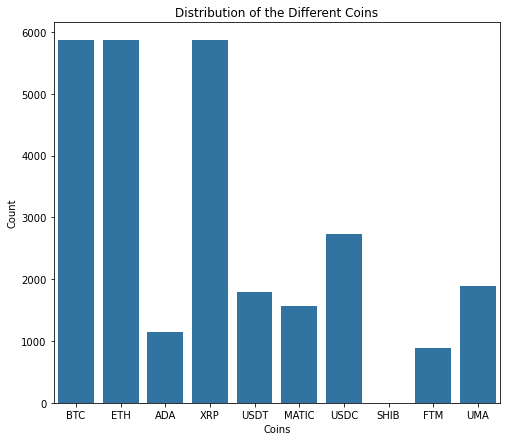

In [18]:
plt.figure(figsize=[8, 7])
color = sb.color_palette()[0]
sb.countplot(data=coins, x = 'Symbol', color=color)
plt.xlabel('Coins')
plt.ylabel('Count')
plt.title('Distribution of the Different Coins');

In [19]:
# let's get the value count of each coin in a dataframe
print(pd.DataFrame(coins['Symbol'].value_counts()))

# let's get the percentage of each coin count
print(pd.DataFrame(coins['Symbol'].value_counts(normalize=True)*100))

       Symbol
BTC      5863
ETH      5863
XRP      5863
USDC     2735
UMA      1889
USDT     1787
MATIC    1565
ADA      1138
FTM       881
SHIB        1
          Symbol
BTC    21.254305
ETH    21.254305
XRP    21.254305
USDC    9.914809
UMA     6.847925
USDT    6.478158
MATIC   5.673373
ADA     4.125430
FTM     3.193765
SHIB    0.003625


**Observation**:We observe that we have had more Bitcoin (BTC), Ethereum (ETH), and Ripple (XRP) cryptocurrencies market exchanges on the Binance trading platform (via Cryptowatch) between 01-September, 2018 till 5th-September, 2022. SHIBA INU(SHIB) was the least traded coin as compared to other coins that were scrapped for this project.

**What is the Distribution of the Open Prices, Close Prices, High Prices, and Low Prices of the Crypto Coins over the four year period?**

In [20]:
# Open Price Distribution on a Log Scale

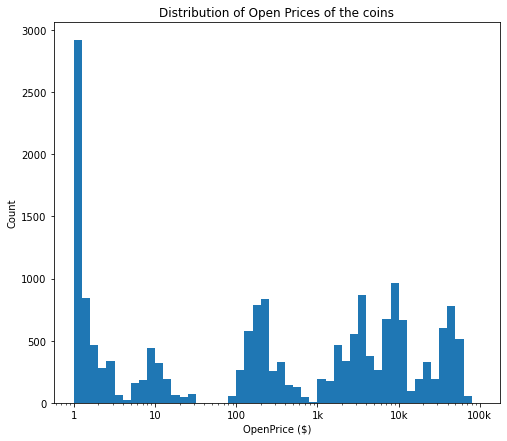

In [21]:
# set the fig size
plt.figure(figsize=[8, 7])

# set the log binsize
log_binsize = 0.5

# Get the ticks for bins between [0 - maximum weight]
bins = 10 ** np.arange(0.000040, 5 + 0.1,  0.1)

# Plot the histogram
plt.hist(data = coins, x = 'OpenPrice', bins=bins)

# The argument in the xscale() represents the axis scale type to apply.
# The possible values are: {"linear", "log", "symlog", "logit", ...}
plt.xscale('log')

# Generate the x-ticks you want to apply and set the ticks label
plt.xticks([1, 10, 100, 1000, 10000, 100000], [1, 10, 100, '1k', '10k', '100k'])

# Add the title labels
plt.title('Distribution of Open Prices of the coins')
plt.xlabel('OpenPrice ($)')
plt.ylabel('Count');

In [22]:
# Close Price Distribution on Log Scale

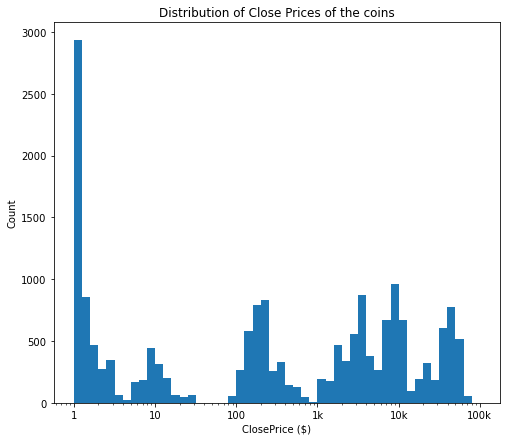

In [23]:
# set the fig size
plt.figure(figsize=[8, 7])

# set the log binsize
log_binsize = 0.5

# Get the ticks for bins between [0 - maximum weight]
bins = 10 ** np.arange(0.000040, 5 + 0.1,  0.1)

# Plot the histogram
plt.hist(data = coins, x = 'ClosePrice', bins=bins)

# The argument in the xscale() represents the axis scale type to apply.
# The possible values are: {"linear", "log", "symlog", "logit", ...}
plt.xscale('log')

# Generate the x-ticks you want to apply and set the ticks label
plt.xticks([1, 10, 100, 1000, 10000, 100000], [1, 10, 100, '1k', '10k', '100k'])

# Add the title labels
plt.title('Distribution of Close Prices of the coins')
plt.xlabel('ClosePrice ($)')
plt.ylabel('Count');

In [24]:
# High Price Distribution on Log Scale

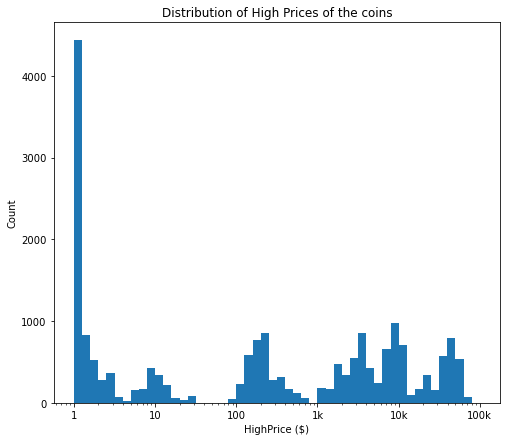

In [25]:
# set the fig size
plt.figure(figsize=[8, 7])

# set the log binsize
log_binsize = 0.5

# Get the ticks for bins between [0 - maximum weight]
bins = 10 ** np.arange(0.000040, 5 + 0.1,  0.1)

# Plot the histogram
plt.hist(data = coins, x = 'HighPrice', bins=bins)

# The argument in the xscale() represents the axis scale type to apply.
# The possible values are: {"linear", "log", "symlog", "logit", ...}
plt.xscale('log')

# Generate the x-ticks you want to apply and set the ticks label
plt.xticks([1, 10, 100, 1000, 10000, 100000], [1, 10, 100, '1k', '10k', '100k'])

# Add the title labels
plt.title('Distribution of High Prices of the coins')
plt.xlabel('HighPrice ($)')
plt.ylabel('Count'); 

In [26]:
# Low Price Distribution on a Log Scale

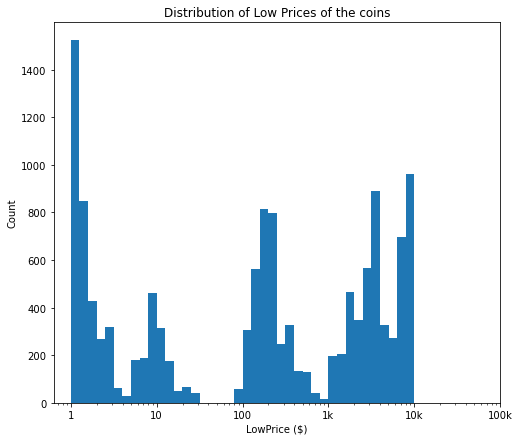

In [27]:
# set the fig size
plt.figure(figsize=[8, 7])

# set the log binsize
log_binsize = 0.1

# Get the ticks for bins between [0 - maximum weight]
bins = 10 ** np.arange(0.000040, 4 + 0.1,  0.1)

# # Generate the x-ticks you want to apply and set the ticks label
# plt.xticks([1, 10, 100, 1000, 10000, 100000], [1, 10, 100, '1k', '10k', '100k'])

# Plot the histogram
plt.hist(data = coins, x = 'LowPrice', bins=bins)

# The argument in the xscale() represents the axis scale type to apply.
# The possible values are: {"linear", "log", "symlog", "logit", ...}
plt.xscale('log')

# Generate the x-ticks you want to apply and set the ticks label
plt.xticks([1, 10, 100, 1000, 10000, 100000], [1, 10, 100, '1k', '10k', '100k'])

# Add the title labels
plt.title('Distribution of Low Prices of the coins')
plt.xlabel('LowPrice ($)')
plt.ylabel('Count');

**Observation:**

We observe different peaks arising in the distribution of OpePrice, ClosePrice, HighPrice, and LowPrice variables, and we have more of these prices occurring between 0 to 1 dollar.

**What is the Overall Distribution of the Volume of the Coins over the four-year Period?**

In [28]:
# Volume Distribution on a Log Scale

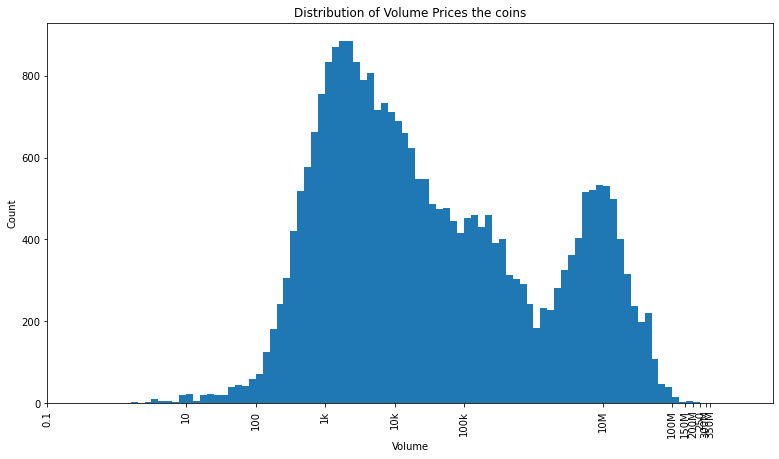

In [29]:
# set the fig size
plt.figure(figsize=[13, 7])

# set the log binsize
log_binsize = 0.1

# Get the ticks for bins between [0 - maximum weight]
bins = 10 ** np.arange(0.1, 9 + 0.1,  0.1)

# Plot the histogram
plt.hist(data = coins, x = 'volume', bins=bins)

# The argument in the xscale() represents the axis scale type to apply.
# The possible values are: {"linear", "log", "symlog", "logit", ...}
plt.xscale('log')

# Generate the x-ticks you want to apply and set the ticks label
plt.xticks([0.1, 10, 100, 1000, 10000, 100000, 10000000, 100000000, 150000000, 200000000, 250000000, 300000000, 350000000],
           [0.1, 10, 100, '1k', '10k', '100k', '10M', '100M', '150M', '200M', '250', '300M', '350M'])

#rotate the xtick labels
plt.xticks(rotation=90)

# Add the title labels
plt.title('Distribution of Volume Prices the coins')
plt.xlabel('Volume')
plt.ylabel('Count');

The Volume distribution is bimodal with the highest peak found between 1000 and 5000 dollars.

**What is the Overall Distribution of the Market Cap over the four-year Period?**

In [30]:
# Distribution of Market Cap on a Log Scale

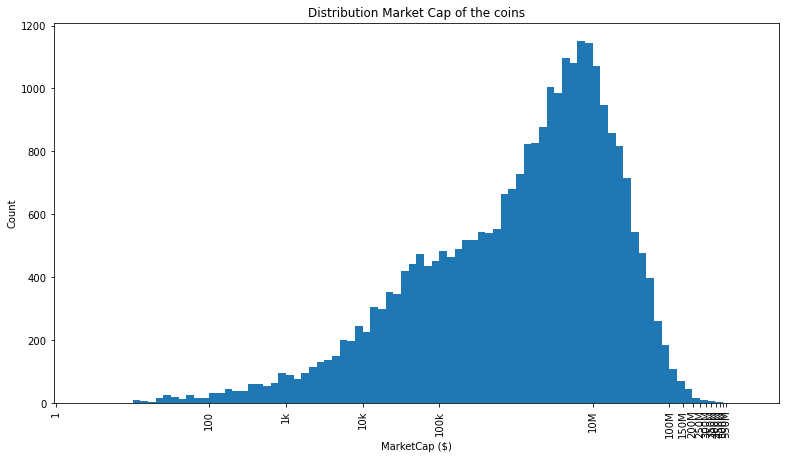

In [31]:
# set the fig size
plt.figure(figsize=[13, 7])

# set the log binsize
log_binsize = 0.1

# Get the ticks for bins between [0 - maximum weight]
bins = 10 ** np.arange(0.4, 9 + 0.1,  0.1)

# Plot the histogram
plt.hist(data = coins, x = 'MarketCap', bins=bins)

# The argument in the xscale() represents the axis scale type to apply.
# The possible values are: {"linear", "log", "symlog", "logit", ...}
plt.xscale('log')

# Generate the x-ticks you want to apply and set the ticks label
plt.xticks([1, 100, 1000, 10000, 100000, 10000000, 100000000, 150000000, 200000000, 250000000, 300000000, 350000000, 400000000, 450000000, 500000000, 550000000],
           [1, 100, '1k', '10k', '100k', '10M', '100M', '150M', '200M', '250M', '300M', '350M','400M', '450M', '500M', '550M'])

# rotate the xtick labels
plt.xticks(rotation=90)

# Add the title labels
plt.title('Distribution Market Cap of the coins')
plt.xlabel('MarketCap ($)')
plt.ylabel('Count');

MarketCap distribution is unimodal, which the highest peak at 9,000,000 Million dollars.

## Bivariate Analysis

**What are the top 5 Cryptocurrencies by market Cap?**

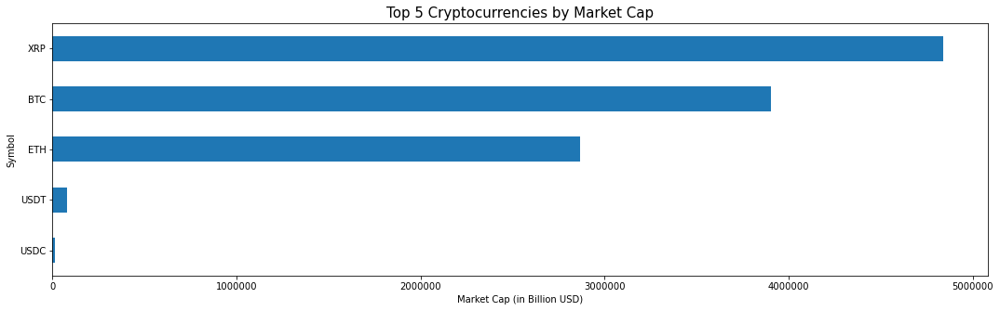

In [32]:
# Finding top 5 cryptocurrencies by market cap
plt.figure(figsize=[18,5])
ax = coins.groupby(['Symbol'])['MarketCap'].last().sort_values(ascending=False).head(5).sort_values().plot(kind='barh')
ax.set_xlabel('Market Cap (in Billion USD)')
ax.ticklabel_format(style='plain', axis='x')
plt.title('Top 5 Cryptocurrencies by Market Cap', fontsize = 15)
plt.show()

**Observation:** We can observe from the above graph that Ripple (XRP) coin currently has the highest market cap, followed by Bitcoin (BTC) and Ethereum (ETH). USD Coin (USDC) being the coin with the least market cap.

This doesn't mean that the XRP coin has had the highest market cap all year round. It means as of 5th September 2022, XRP's market Cap was higher. It simply means that there is currently a high supply XRP coins in circulation compared to other coins.

**What are the Crypto Coins Performances as Per Open Price, Close Price, High and Low Prices?**

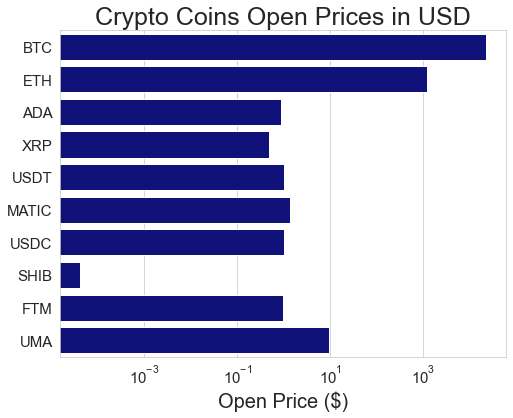

In [33]:
# use a barchart to view the coin performance as per OpenPrice

sb.set_style('whitegrid')
bar,ax = plt.subplots(figsize=(8,6))
ax = sb.barplot(x='OpenPrice', y='Symbol', data=coins, ci=None, color='darkblue', orient='h')
ax.set_title('Crypto Coins Open Prices in USD', fontsize=25)
ax.set(xscale = 'log') # set scale to view others
ax.set_xlabel('Open Price ($)', fontsize = 20)
ax.set_ylabel(None, fontsize = 20)
ax.tick_params(axis='x', labelsize = 15)
ax.tick_params(axis='y', labelsize = 15)
#plt.savefig('cryptoprice.svg')

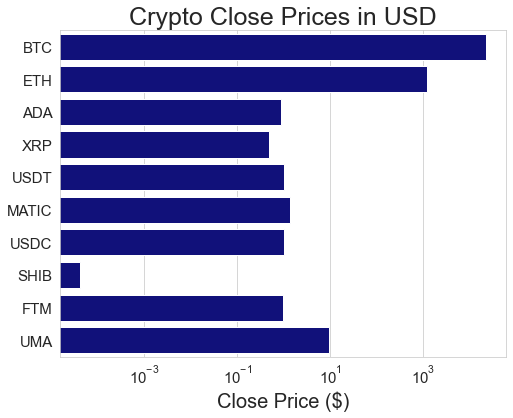

In [34]:
# use a barchart to view the coin performance as per ClosePrice

sb.set_style('whitegrid')
bar,ax = plt.subplots(figsize=(8,6))
ax = sb.barplot(x='ClosePrice', y='Symbol', data=coins, ci=None, color='darkblue', orient='h')
ax.set_title('Crypto Close Prices in USD', fontsize=25)
ax.set(xscale = 'log') # set scale to view others
ax.set_xlabel('Close Price ($)', fontsize = 20)
ax.set_ylabel(None, fontsize = 20)
ax.tick_params(axis='x', labelsize = 15)
ax.tick_params(axis='y', labelsize = 15)
plt.savefig('cryptoprice.svg')

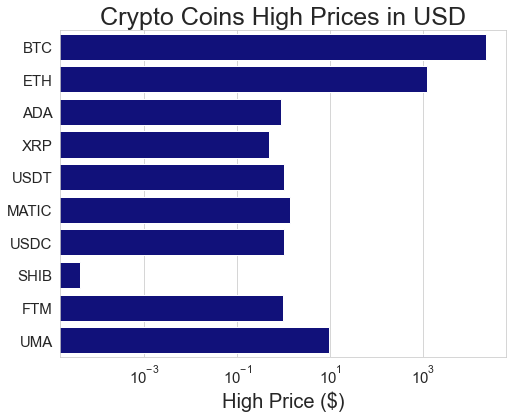

In [35]:
# use a barchart to view the coin performance as per HighPrice

sb.set_style('whitegrid')
bar,ax = plt.subplots(figsize=(8,6))
ax = sb.barplot(x='HighPrice', y='Symbol', data=coins, ci=None, color='darkblue', orient='h')
ax.set_title('Crypto Coins High Prices in USD', fontsize=25)
ax.set(xscale = 'log') # set scale to view others
ax.set_xlabel('High Price ($)', fontsize = 20)
ax.set_ylabel(None, fontsize = 20)
ax.tick_params(axis='x', labelsize = 15)
ax.tick_params(axis='y', labelsize = 15)
#plt.savefig('cryptoprice.svg')

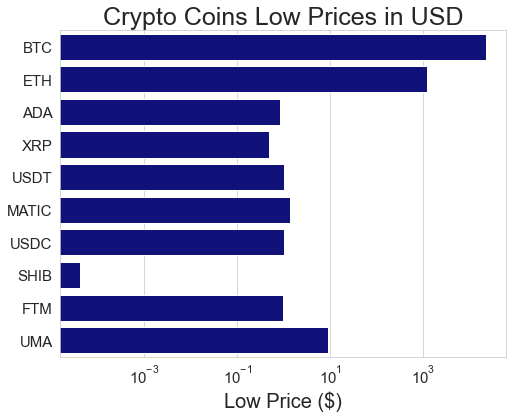

In [36]:
# use a barchart to view the coin performance as per LowPrice

sb.set_style('whitegrid')
bar,ax = plt.subplots(figsize=(8,6))
ax = sb.barplot(x='LowPrice', y='Symbol', data=coins, ci=None, color='darkblue', orient='h')
ax.set_title('Crypto Coins Low Prices in USD', fontsize=25)
ax.set(xscale = 'log') # set scale to view others
ax.set_xlabel('Low Price ($)', fontsize = 20)
ax.set_ylabel(None, fontsize = 20)
ax.tick_params(axis='x', labelsize = 15)
ax.tick_params(axis='y', labelsize = 15)
#plt.savefig('cryptoprice.svg')

**Observation**: We observe that Bitcoin(BTC) has the highest ClosePrice, OpenPrice, HighPrice, and LowPrice values, followed by Ethereum (ETH), UMA, and MATIC.

## Multivariate Analysis

**Is there any correlation between variables?**

In [37]:
coins.corr()

,OpenPrice,HighPrice,LowPrice,ClosePrice,volume,MarketCap
OpenPrice,1.000000,0.999894,0.999805,0.999775,-0.127956,0.519699
HighPrice,0.999894,1.000000,0.999755,0.999888,-0.127962,0.523903
LowPrice,0.999805,0.999755,1.000000,0.999862,-0.127972,0.511911
ClosePrice,0.999775,0.999888,0.999862,1.000000,-0.127965,0.518901
volume,-0.127956,-0.127962,-0.127972,-0.127965,1.000000,0.076168
MarketCap,0.519699,0.523903,0.511911,0.518901,0.076168,1.000000


In [38]:
variables = ['CloseTime', 'OpenPrice', 'HighPrice', 'LowPrice', 'ClosePrice',
       'volume', 'MarketCap', 'Symbol']

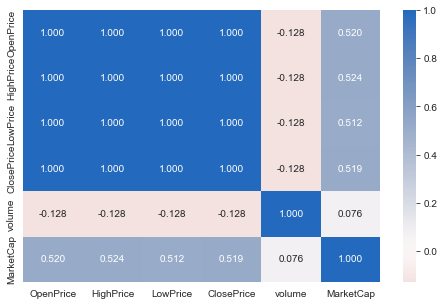

In [39]:
# correlation plot
plt.figure(figsize = [8, 5])
sb.heatmap(coins[variables].corr(), annot = True, fmt = '.3f',
           cmap = 'vlag_r', center = 0)

plt.show();

We observe that the Market Cap variable has a positive correlation with the Open, Close, Low, and high prices. This means that a Market Cap could be increasing or decreasing when each of those variables increases or decreases respectively. This is because the price contributes to the increase or decrease of the crypto coin market cap.

**What are the top four Crytocurrencies with the Highest Closing Prices as Per Market Cap?**

___Plotting graphs of closing prices of top 4 Cryptocurrencies as Per Market Cap___

In [40]:
# make a copy of the original  dataset
dx = coins.copy()

# create different dataframes for the top four coins you want to consider at each point
top_4_currency_names = dx.groupby(['Symbol'])['MarketCap'].last().sort_values(ascending=False).head(4).index
top_4_currency_names_except_first = dx[dx['Symbol']!= 'BTC'].groupby(['Symbol'])['MarketCap'].last().sort_values(ascending=False).head(4).index
top_4_currency_names_except_first_two = dx[(dx['Symbol']!= 'BTC') & (dx['Symbol']!= 'ETH')].groupby(['Symbol'])['MarketCap'].last().sort_values(ascending=False).head(4).index
top_4_currency_names_except_first_two_three = dx[(dx['Symbol']!= 'BTC') & (dx['Symbol']!= 'ETH') & (dx['Symbol']!= 'USDT')].groupby(['Symbol'])['MarketCap'].last().sort_values(ascending=False).head(4).index
top_4_currency_names_except_first_two_three_four = dx[(dx['Symbol']!= 'BTC') & (dx['Symbol']!= 'ETH') & (dx['Symbol']!= 'XRP') & (dx['Symbol']!= 'USDT')].groupby(['Symbol'])['MarketCap'].last().sort_values(ascending=False).head(4).index


data_top_4_currencies = dx[dx['Symbol'].isin(top_4_currency_names)]
top_4_currencies_after_BTC = dx[dx['Symbol'].isin(top_4_currency_names_except_first)]
top_4_currencies_after_BTC_ETH = dx[dx['Symbol'].isin(top_4_currency_names_except_first_two)]
top_4_currencies_after_BTC_ETH_USDT = dx[dx['Symbol'].isin(top_4_currency_names_except_first_two_three)]
top_4_currencies_after_BTC_ETH_USDT_XRP = dx[dx['Symbol'].isin(top_4_currency_names_except_first_two_three_four)]

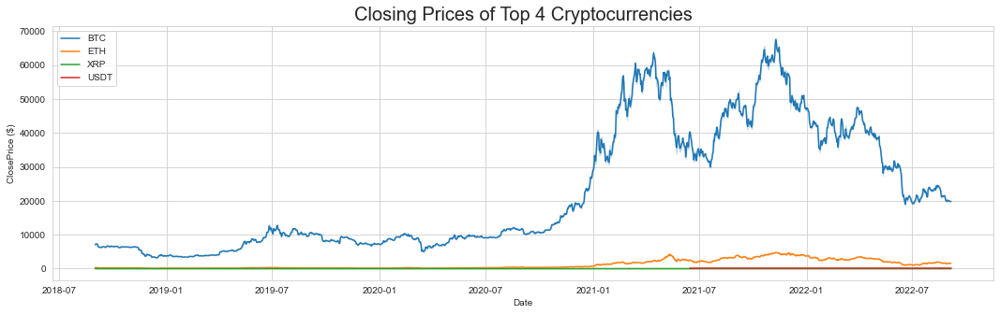

In [41]:
plt.figure(figsize=[18,5])
sb.lineplot(data=data_top_4_currencies, x="Date", y="ClosePrice", hue='Symbol')
plt.title("Closing Prices of Top 4 Cryptocurrencies", fontsize=20)
plt.ylabel('ClosePrice ($)', fontsize=10)
plt.legend(loc='upper left');

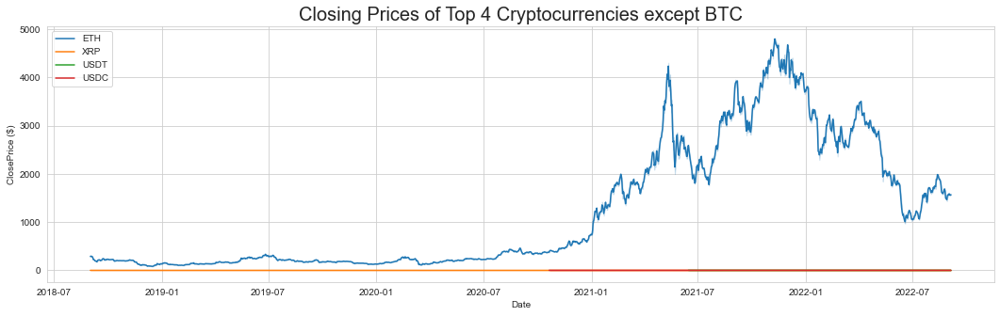

In [42]:
plt.figure(figsize=[18,5])
sb.lineplot(data=top_4_currencies_after_BTC, x="Date", y="ClosePrice", hue='Symbol')
plt.title("Closing Prices of Top 4 Cryptocurrencies except BTC", fontsize=20)
plt.ylabel('ClosePrice ($)', fontsize=10)
plt.legend(loc='upper left');

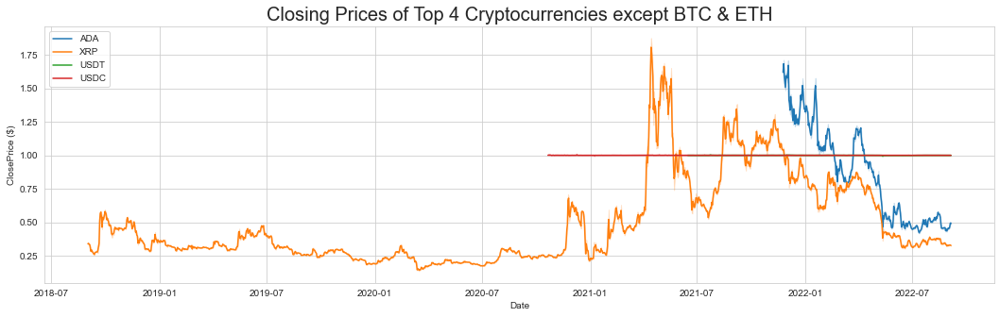

In [43]:
plt.figure(figsize=[18,5])
sb.lineplot(data=top_4_currencies_after_BTC_ETH,x="Date", y="ClosePrice", hue='Symbol')
plt.title("Closing Prices of Top 4 Cryptocurrencies except BTC & ETH", fontsize=20)
plt.ylabel('ClosePrice ($)', fontsize=10)
plt.legend(loc='upper left');

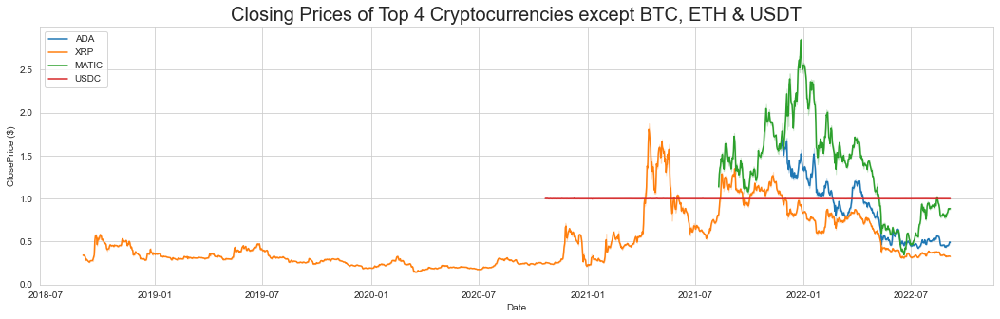

In [44]:
plt.figure(figsize=[18,5])
sb.lineplot(data=top_4_currencies_after_BTC_ETH_USDT,x="Date", y="ClosePrice", hue='Symbol')
plt.title("Closing Prices of Top 4 Cryptocurrencies except BTC, ETH & USDT", fontsize=20)
plt.ylabel('ClosePrice ($)', fontsize=10)
plt.legend(loc='upper left');

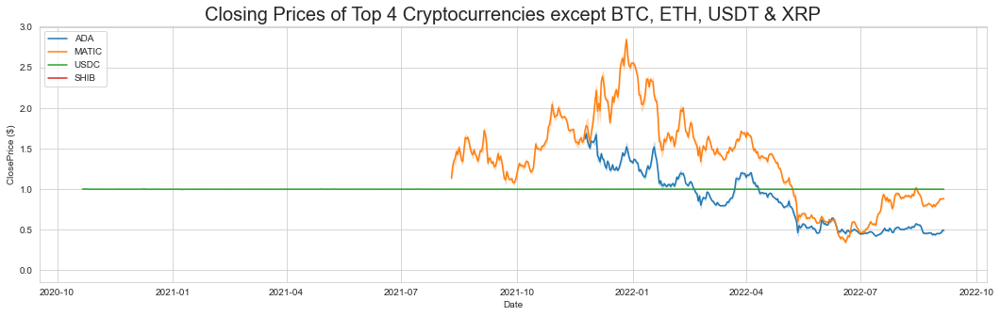

In [45]:
plt.figure(figsize=[18,5])
sb.lineplot(data=top_4_currencies_after_BTC_ETH_USDT_XRP,x="Date", y="ClosePrice", hue='Symbol')
plt.title("Closing Prices of Top 4 Cryptocurrencies except BTC, ETH, USDT & XRP", fontsize=20)
plt.ylabel('ClosePrice ($)', fontsize=10)
plt.legend(loc='upper left');

**Observation**: We observe that Bitcoin's (BTC) Close price has been all-time high, rising to 70,000 dollars in 2021, which made the Close Prices of other cryptocurrencies invincible. Ethereum (ETH), Cardona (ADA), and Polygon (MATIC) also showed high Close Prices when compared with other cryptocurrencies. The graph shows that BTC, ADA, ETH, and MATIC had high values for the past four years.

**What is the Market Trend of these Cryptocurriencies using a CandleStick Chart?**

___Plotting a Candlestick charts of top 6 selected Cryptocurrencies to study market trends___

In [46]:
for i in ['BTC','ETH','USDT','MATIC','ADA', 'XRP']:
    options=[i]
    result_df = coins[coins['Symbol'].isin(options)] 
    layout = dict(
            title=f"{i} Candlestick Chart",
            xaxis=go.layout.XAxis(title=go.layout.xaxis.Title( text="Time")),
            yaxis=go.layout.YAxis(title=go.layout.yaxis.Title( text="Price in US Dollars"))
    )
    data=[go.Candlestick(x=result_df ['Date'],
                    open=result_df ['OpenPrice'],
                    high=result_df ['HighPrice'],
                    low=result_df ['LowPrice'],
                    close=result_df ['ClosePrice'])]
    figSignal = go.Figure(data=data,layout=layout)

    figSignal.show();

A candlestick chart is an interactive chart; a combination of multiple candles that a trader uses to anticipate the price movement of a cryptocurrency.

**Observation:**

We could observe a symmetric pattern in the time series graphs.

Symmetric patterns happen when buyers and sellers become indecisive about the market. Hence, the price starts to squeeze due to the unavailability of supply and demand.

The patterns show bullish and bearish trends at different points in time, and the volume usually drops with time while this pattern is formed.

We observe that the USDT market trend is very volatile and should be avoided as much as possible. It's not so clear when you should buy and sell in that market.

**What is the Market Trend of the Cryptocurrencies as Regards to the Moving Averages of the Coins?**

___Plotting graphs of Closing prices vs Moving averages of top 6 Cryptocurrencies to study Market trends___

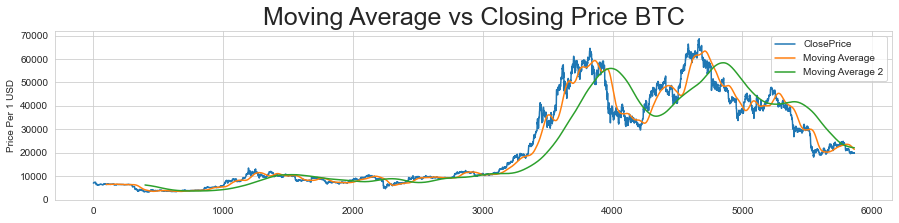

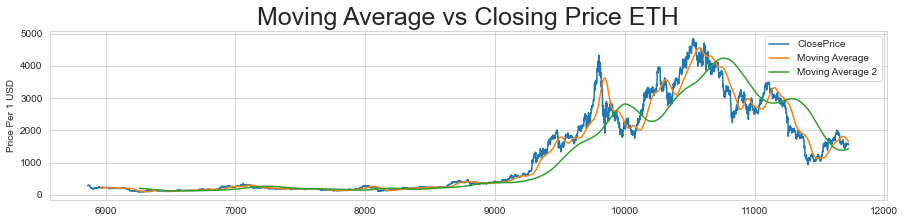

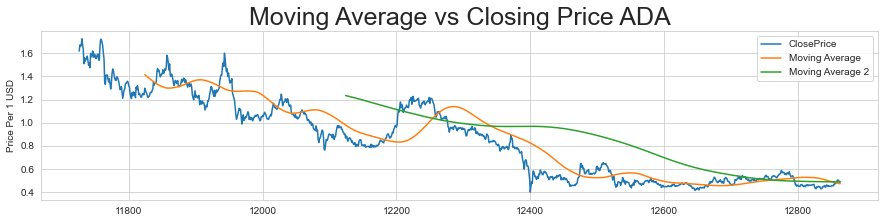

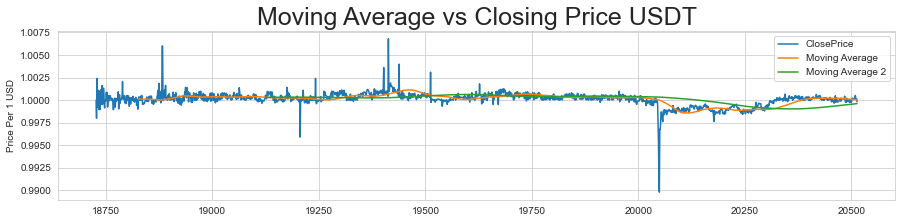

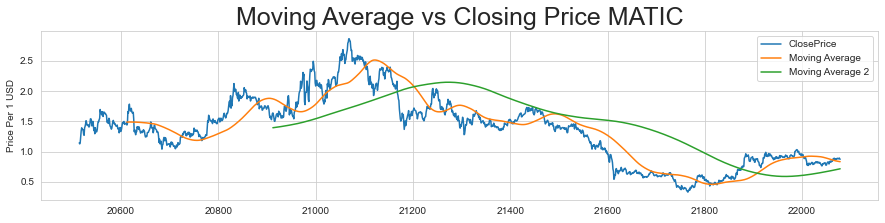

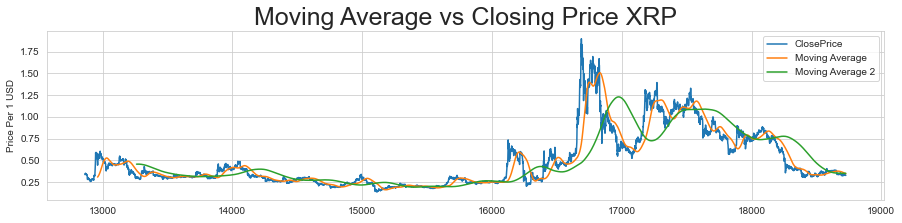

In [47]:
for i in ['BTC', 'ETH', 'ADA', 'USDT', 'MATIC', 'XRP']:
    j=1
    df = coins[coins['Symbol']==i]
    top_currency_name = df.groupby(['Symbol'])['MarketCap'].last().sort_values(ascending=False).index
    top_currency = df[df['Symbol'].isin(top_currency_name)]
    top_currency['Moving Average']=top_currency['ClosePrice'].rolling(window=50).mean()
    top_currency['Moving Average 2']=top_currency['ClosePrice'].rolling(window=200).mean()
    
    plt.subplot(5,1,j)
    top_currency['ClosePrice'].plot(figsize=(15,18))
    ax=top_currency['Moving Average'].rolling(window=50).mean().plot()
    ax=top_currency['Moving Average 2'].rolling(window=200).mean().plot()
    ax.set_ylabel('Price Per 1 USD');
    plt.title(f'Moving Average vs Closing Price {i}', fontsize = 25);
    plt.legend()
    j=j+1
    plt.show();

**Observation**:

We could observe three bullish crosses and three bearish crosses in the bitcoin(BTC) crypto market over the years. The last crossing point wasn't clear as both moving averages merged together. We can't specifically say if the BTC market at that point is bullish or bearish.

in ETH and MATIC market, a bullish cross is seen appearing as the last crossing pont of the moving averages. This shows a bullish trend in those crypto markets it also indicates a good time to trade on those coins.

The last crossing point in XRP and ADA isn't so clear at the moment so you can't say the market of these the two coins is bullish or bearish.

As much as a bullish trend is shown in USDT market, it's still a very volatile market, so it is advisable to avoid the market at the moment.

**What are the mean Open, Close, High and Low Prices of all the Cryptocurrencies?**

___Plotting the mean prices (Open, Close, High, and Low) of the various Cryptocurrencies.___

In [48]:
# check the mean performance of all
df = coins.groupby('Symbol').agg({'ClosePrice':np.mean, 'OpenPrice':np.mean, 'HighPrice':np.mean, 
                                  'LowPrice':np.mean}).reset_index()
fig = px.line(df, x='Symbol', y=['ClosePrice', 'HighPrice', 'LowPrice', 'OpenPrice'])
fig.update_layout(autosize=False,
                 width=500,
                 height=500,
                 template='plotly_dark',
                 yaxis_title = 'Price ($)',
                 title = 'Mean Prices of Cryptocurrencies',
                 hovermode='x',
                 title_x=0.5
)
fig.update_yaxes(# the y axis is in dollars
    tickprefix='$', showgrid=True
)

From the interactive plot, we observe that bitcoin(BTC) has the highest mean HighPrice of 22.71143k, ClosePrice of 22.40423k, OpenPrice of 22.40232k, and the highest mean LowPrice of 22.05838k dollars.

___Which Cryptocurrency had the highest HighPrice Over the Years?___

In [49]:
area = px.area(data_frame = coins, y = 'HighPrice', x = 'Date', line_group= 'Symbol', color= 'Name', color_discrete_sequence=px.colors.qualitative.Alphabet_r, 
               title = 'Area Plot for HighPrice of all Cryptocurrencies')

area.update_xaxes(title_text = 'Date', rangeslider_visible = True, rangeselector = dict(buttons = list([
    dict(count = 1, label = '1Month', step = 'month', stepmode = 'backward'),
    dict(count = 6, label = '6Month', step = 'month', stepmode = 'backward'),
    dict(count = 1, label = 'YearTillDate', step = 'year', stepmode = 'todate'),
    dict(count = 1, label = '1Year', step = 'year', stepmode = 'backward'),
    dict(step = 'all')])))

area.update_yaxes(title_text = 'Price in USD', ticksuffix = '$')
area.update_layout(showlegend = True, title = {'text': 'Area Plot for HighPrice of all Cryptocurrencies', 'y':0.9, 'x':0.5, 'xanchor': 'center',
                                              'yanchor': 'top'})

area.show()

This interactive area chart shows the High Prices of each of the crypto coins. You can examine each one by highlighting the legend of a particular coin, and you can examine a crypto coins performance over the past one month, 6 months, past one year till date, or for all the years.

From the chart, we observe that bitcoin(BTC) has had the highest HighPrice over the years, which was about $70,000, and currently has the  highest HighPrice at about 20,000 dollars.

___Which Cryptocurrency had the highest Market Cap Over the Years?___

In [50]:
area = px.area(data_frame = coins, y = 'MarketCap', x ='Date', line_group = 'Symbol', color = 'Name', color_discrete_sequence=px.colors.qualitative.Alphabet, 
              title= 'Area Plot Showcasing the Market Cap of all Cryptocurrencies')

area.update_xaxes(title_text = 'Date', rangeslider_visible = True, rangeselector = dict(buttons = list([
    dict(count = 1, label = '1Month', step = 'month', stepmode = 'backward'),
    dict(count = 6, label = '6Months', step = 'month', stepmode = 'backward'),
    dict(count = 1, label = 'YeaTillDate', step = 'year', stepmode = 'todate'),
    dict(count = 1, label = '1Year', step = 'year', stepmode = 'backward'),
    dict(step = 'all')])))

area.update_yaxes(title_text = 'Percentage Change ($)', ticksuffix = '%')
area.update_layout(showlegend = True, title = {'text': 'Area Plot Showcasing the Market Cap Change of all Cryptocurrencies', 
                                               'y':0.9, 'x':0.5, 'xanchor': 'center', 'yanchor': 'top'})

area.show()

As of September 5th, 2022, XRP had the highes percentage maret cap of about 4.820165M%. BTC's percentage market cap change was about 3.903218M% followed by ETH whose percentage market price was 1.797722M%.

# CONCLUSION

 - As of 5th Sepetember, 2022, Ripple (XRP) had the highest percentage market cap value which was about 4.840165M% followed by Bitcoin (BTC) and Etherium (ETH) whose percentage change of market price value are about 3.903218M% and 2.866002M% respectively.
 
  
 - Bitcoin's (BTC) Close price has always been the highest that it makes the high price of other cryptocurrencies invincible. Ethereum (ETH), Cardona (ADA), and Polygon (MATIC) also showed high Close Prices when compared with other cryptocurrencies. The graph shows that BTC, ADA, ETH, and MATIC had high values for the past four years.

  
  - With a candlestick chart, there has been a symmetric pattern in the different crypto coins prices for the past four years, and this is said to happen when the buyers and sellers become indecisive about the market. There were bullish and bearish trends at different points in time, and the volumes of the coins were seen to drop over time due to this pattern.
  
  
  - USDT market trend is very volatile and should be avoided as much as possible. It's not so clear when you should buy and sell in that market.
  

  - The graph of Moving averages of coins against their Close Prices shows that the Bitcoin market currently neither bullish nor bearish, while ETC and MATIC market show a bullish trend which indicates a good time to trade on those coins. 

NB: Some the charts which are interactive are Plotly charts and are aren't displayed on Github. To view all the charts in this Github Notebook, you must copy the url of this page and paste it in this [notebook viewer](http://nbviewer.jupyter.org/) which will present a rich view of the notebook.

Aticles that I deeply studied for the success of this project are:
    
 - https://www.forbes.com/advisor/in/investing/what-is-cryptocurrency-and-how-does-it-work/
 
 - https://www.kaspersky.com/resource-center/definitions/what-is-cryptocurrency
 
 - https://learn.bybit.com/crypto/market-cap-explained/
 
 - https://bitsgap.com/blog/moving-average-ma-explained-for-crypto-trading-how-does-it-work
 
 - https://coinrivet.com/moving-averages-in-cryptocurrency-explained/
    
 - https://learn.bybit.com/candlestick/how-to-read-candlestick-charts/abs
 
 - https://www.coinbase.com/learn/tips-and-tutorials/how-to-read-candlestick-charts

In [51]:
coins.to_csv('crypto_coins.csv', index=False)